In [178]:
import cv2
import numpy as np
from skimage.metrics import peak_signal_noise_ratio as psnr
from skimage.metrics import structural_similarity as ssim
from matplotlib import pyplot as plt
import tensorflow as tf
from patchify import patchify, unpatchify
from file_utils import get_file_names_from_folder

In [206]:
def load_image(path):
    
    gt_img = cv2.imread(path)
    gt_img = cv2.cvtColor(gt_img, cv2.COLOR_BGR2RGB)
    gt_img = cv2.resize(gt_img, (64 * (gt_img.shape[0] // 64), 64 * (gt_img.shape[1] // 64)))
    gt_img = gt_img/255

    return gt_img

def calculate_key_metrics(gt_image, noise_image):
    psnr_value = psnr(gt_image, noise_image)
    ssim_value = ssim(gt_image, noise_image, channel_axis=2, data_range=noise_image.max() - noise_image.min())
    return (psnr_value, ssim_value)

# load test set
images = []
gt_images = []
file_names = get_file_names_from_folder('data/test_dataset/', '*.bmp*')
file_names.sort()
for file_name in file_names:
    if file_name.split('/')[-1].endswith('Reference.bmp'):
        gt_images.append(load_image(file_name))
    else:
        images.append(load_image(file_name))

Text(0.5, 1.0, 'Ground True image part')

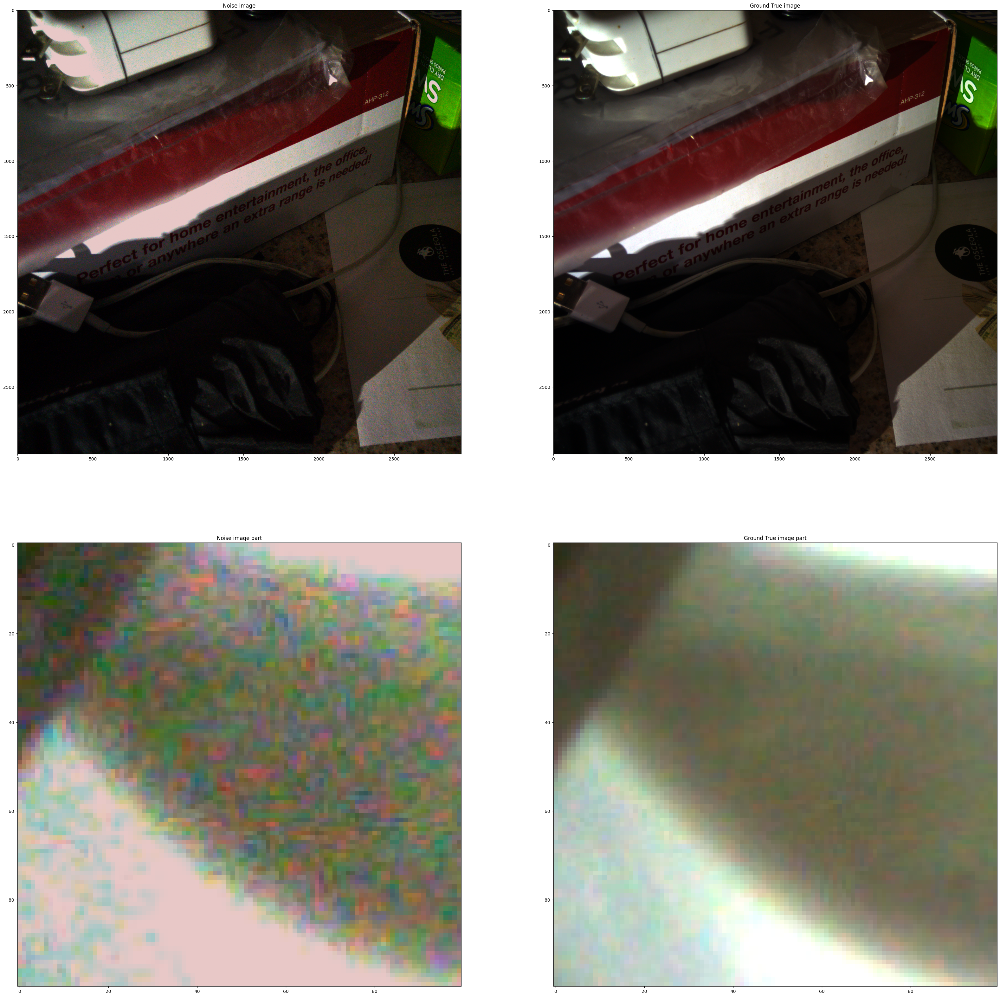

In [258]:
index = np.random.randint(0, len(images))
image = images[index]
gt_image = gt_images[index]
plt.subplot(2, 2, 1), plt.imshow(image),
plt.title('Noise image')
plt.subplot(2, 2, 2), plt.imshow(gt_image),
plt.title('Ground True image')
plt.subplot(2, 2, 3), plt.imshow(image[200:300, 200:300,:]),
plt.title('Noise image part')
plt.subplot(2, 2, 4), plt.imshow(gt_image[200:300, 200:300,:]),
plt.title('Ground True image part')

In [259]:
# split images to pathes
image_pathes = patchify(image, (64, 64, 3), step=64)
image_shape = image_pathes.shape
original_image = unpatchify(image_pathes, image.shape)
#plt.imshow(unpatchify(image_pathes, image.shape))
image_pathes = image_pathes.reshape((-1,64, 64,3))

In [260]:
# Gaussian PSNR: 24.667350507714517
# Gaussian SSID: 0.642281021642178
#load model
#model_patches_64_20_e_256_2_dataset
#model_patches_64_40_e_256_2_dataset_10_big_images  24.979 0.794
#model_patches_64_40_e_256_2_dataset_30_big_images  24.90 0.80
#model_patches_64_40_e_256_2_dataset_30_big_images_with_callbaks 24.88 0.7932
#model_patches_64_bs_128_e_20_30_big_images_from_end_with_callbaks 24.90 0.79
#model_patches_64_bs_128_e_20_30_big_images_from_end_with_callbaks_2 24.89 0.78
new_model = tf.keras.models.load_model('model_patches_64_40_e_256_2_dataset_10_big_images')


In [261]:
predictions = new_model.predict(image_pathes)
predicted = np.reshape(predictions, image_shape)
predicted_image = unpatchify(predicted, image.shape)
gaussian_image = cv2.GaussianBlur(image,(5,5),0)

67/67 [==============================] - 3s 44ms/step


In [253]:
metrics_original = calculate_key_metrics(gt_image, image)
print('Original PSNR:', metrics_original[0])
print('Original SSID:', metrics_original[1])
metrics_denoised = calculate_key_metrics(gt_image, predicted_image)
print('Network PSNR:', metrics_denoised[0])
print('Network SSID:', metrics_denoised[1])
metrics_gaussian = calculate_key_metrics(gt_image, gaussian_image)
print('Gaussian PSNR:', metrics_gaussian[0])
print('Gaussian SSID:', metrics_gaussian[1])

Original PSNR: 27.97273171390315
Original SSID: 0.6362396968946672


/var/folders/zr/m75tnm4s4p1cj7v9pr8mtrdr0000gn/T/ipykernel_36843/4124400842.py:11: UserWarning: Inputs have mismatched dtype.  Setting data_range based on image_true.
  psnr_value = psnr(gt_image, noise_image)


Network PSNR: 30.932646987780178
Network SSID: 0.8896192811416066
Gaussian PSNR: 30.69762851502111
Gaussian SSID: 0.7808713495663971


(Text(0.5, 1.0, 'Gaussian Blur image'), (-0.5, 199.5, 199.5, -0.5))

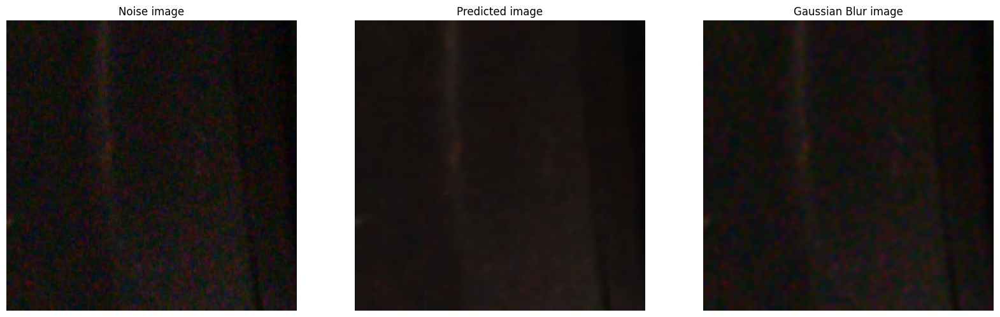

In [254]:
plt.rcParams['figure.figsize'] = [20, 20]
plt.subplot(1, 3, 1), plt.imshow(image[200:400,400:600:])
plt.title('Noise image'), plt.axis(False)
plt.subplot(1, 3, 2), plt.imshow(predicted_image[200:400,400:600:])
plt.title('Predicted image'), plt.axis(False)
plt.subplot(1, 3, 3), plt.imshow(gaussian_image[200:400,400:600:])
plt.title('Gaussian Blur image'), plt.axis(False)

(Text(0.5, 1.0, 'Ground true image'), (-0.5, 1855.5, 2175.5, -0.5))

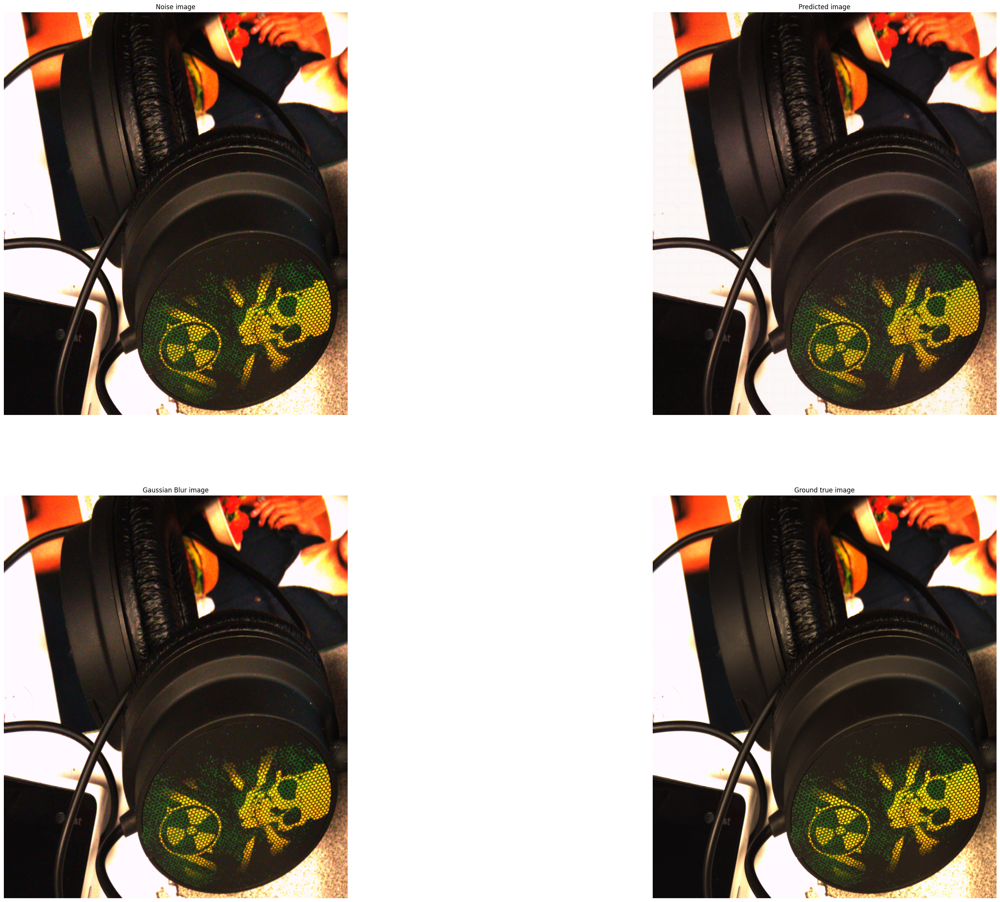

In [255]:
plt.rcParams['figure.figsize'] = [40, 30]
plt.subplot(2, 2, 1), plt.imshow(image)
plt.title('Noise image'), plt.axis(False)
plt.subplot(2, 2, 2), plt.imshow(predicted_image)
plt.title('Predicted image'), plt.axis(False)
plt.subplot(2, 2, 3), plt.imshow(gaussian_image)
plt.title('Gaussian Blur image'), plt.axis(False)
plt.subplot(2, 2, 4), plt.imshow(gt_image)
plt.title('Ground true image'), plt.axis(False)

(Text(0.5, 1.0, 'Ground true image'), (-0.5, 99.5, 99.5, -0.5))

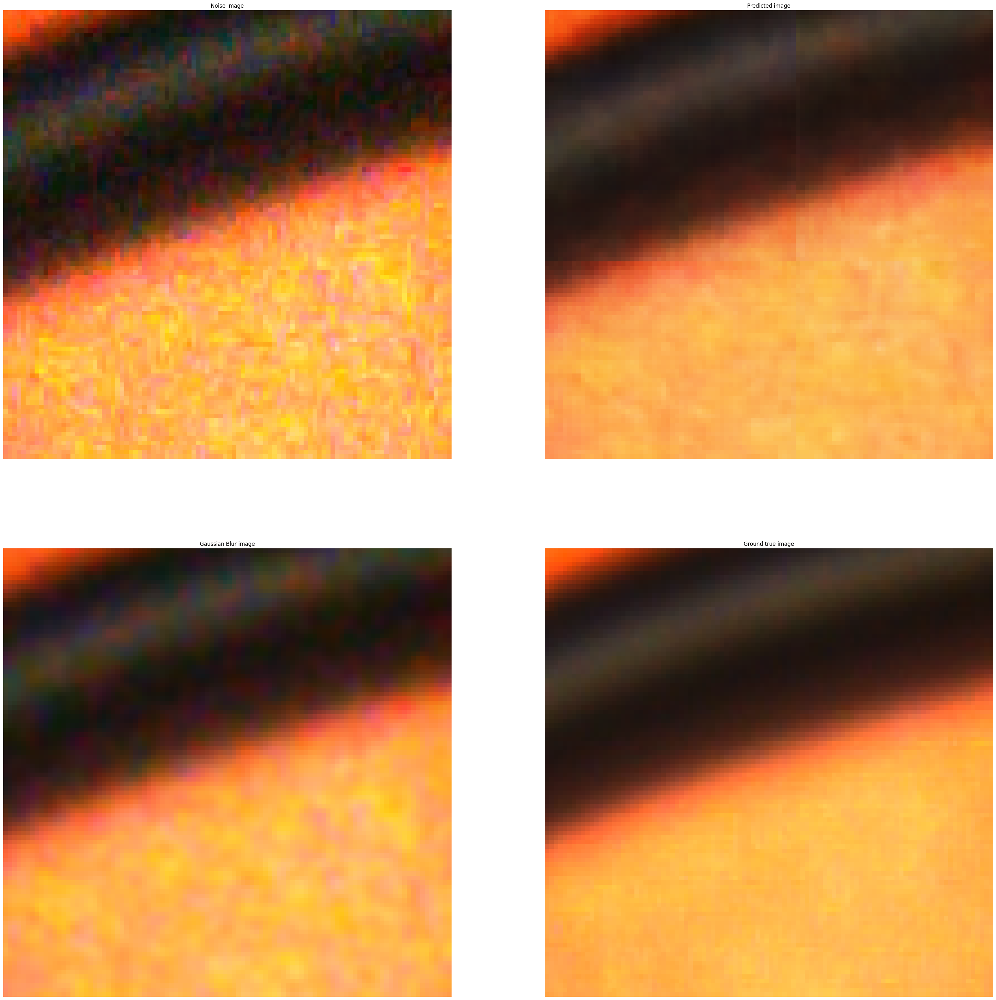

In [256]:
plt.rcParams['figure.figsize'] = [40, 40]
plt.subplot(2, 2, 1), plt.imshow(image[200:300, 200:300,:])
plt.title('Noise image'), plt.axis(False)
plt.subplot(2, 2, 2), plt.imshow(predicted_image[200:300, 200:300,:])
plt.title('Predicted image'), plt.axis(False)
plt.subplot(2, 2, 3), plt.imshow(gaussian_image[200:300, 200:300,:])
plt.title('Gaussian Blur image'), plt.axis(False)
plt.subplot(2, 2, 4), plt.imshow(gt_image[200:300, 200:300,:])
plt.title('Ground true image'), plt.axis(False)